In [53]:
import math

import pandas as pd
from sentence_transformers import SentenceTransformer, InputExample
from sentence_transformers import models, losses
from sentence_transformers.evaluation import EmbeddingSimilarityEvaluator
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

from umap import umap_ as UMAP
from plotly import express as ex

In [5]:
model_name = 'princeton-nlp/sup-simcse-roberta-base'

word_embedding_model = models.Transformer(model_name, max_seq_length=256)
pooling_model = models.Pooling(
    word_embedding_model.get_word_embedding_dimension(),
    pooling_mode_mean_tokens=True
)
model = SentenceTransformer(modules=[word_embedding_model, pooling_model])

In [6]:
df = pd.read_csv("data_with_text.csv")

In [7]:
texts = list(map(lambda x: InputExample(texts=[x, x]), df["vacancy_description"].tolist()))

In [8]:
train_text, test_text = train_test_split(texts, train_size=0.8)

In [9]:
train_dataloader = DataLoader(train_text, batch_size=32, shuffle=True)

In [10]:
# Configure the training
num_epochs = 1

# Use MultipleNegativesRankingLoss for SimCSE
train_loss = losses.MultipleNegativesRankingLoss(model)

model_save_path = "./models/"
warmup_steps = math.ceil(len(train_dataloader) * num_epochs * 0.1) #10% of train data for warm-up

# Train the model
model.fit(train_objectives=[(train_dataloader, train_loss)],
          epochs=num_epochs,
          evaluation_steps=100,
          warmup_steps=warmup_steps,
          output_path=model_save_path
          )

Epoch:   0%|          | 0/1 [00:00<?, ?it/s]

Iteration:   0%|          | 0/9323 [00:00<?, ?it/s]

In [33]:
test_loader = DataLoader(test_text, batch_size=32, shuffle=False)

In [20]:
test_res = [model.encode(text.texts[0]) for text in test_text]

In [23]:
umap = UMAP.UMAP().fit(test_res)

In [24]:
X_encoded = umap.transform(test_res)

In [49]:
indexs = []
for text in test_text:
    indexs.append(df[df["vacancy_description"] == text.texts[0]].index[0])

In [50]:
indexs[:10]

[332999, 126309, 52814, 65830, 66110, 324793, 70676, 67313, 260292, 30601]

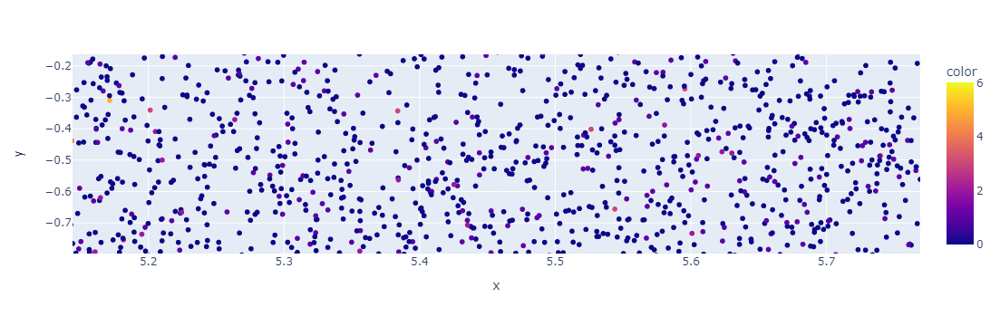

In [52]:
ex.scatter(x=X_encoded[:, 0], y=X_encoded[:, 1], color=df.iloc[indexs]["target"])

In [13]:
test_evaluator = EmbeddingSimilarityEvaluator.from_input_examples(
    test_text, batch_size=32, name="vacancy-test"
)
test_evaluator(model, output_path=model_save_path)

D:\pd\ML_part\venv\lib\site-packages\sentence_transformers\evaluation\EmbeddingSimilarityEvaluator.py:120: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  eval_pearson_cosine, _ = pearsonr(labels, cosine_scores)
D:\pd\ML_part\venv\lib\site-packages\sentence_transformers\evaluation\EmbeddingSimilarityEvaluator.py:121: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  eval_spearman_cosine, _ = spearmanr(labels, cosine_scores)
D:\pd\ML_part\venv\lib\site-packages\sentence_transformers\evaluation\EmbeddingSimilarityEvaluator.py:123: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  eval_pearson_manhattan, _ = pearsonr(labels, manhattan_distances)
D:\pd\ML_part\venv\lib\site-packages\sentence_transformers\evaluation\EmbeddingSimilarityEvaluator.py:124: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  eval_s

nan

In [57]:
cluster_labels = KMeans(n_clusters=7).fit_predict(test_res)

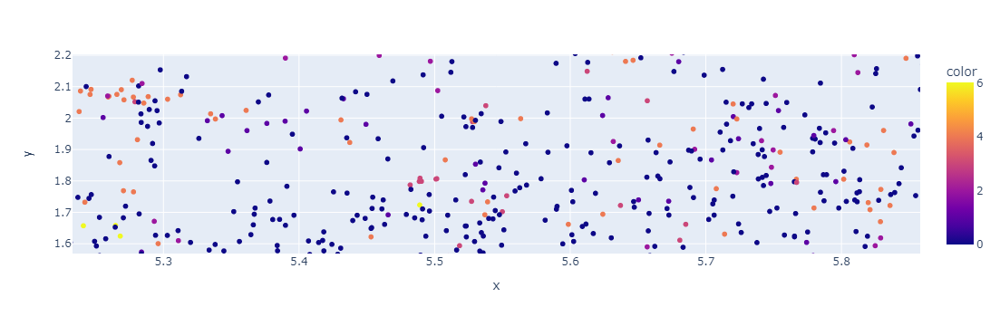

In [59]:
ex.scatter(x=X_encoded[:, 0], y=X_encoded[:, 1], color=cluster_labels)